In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
#

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

DATA_DIR =    "/home/camata/git/cgp-grn/data/"
FP_CITE_TRAIN_INPUTS = os.path.join(DATA_DIR, "train_cite_inputs.h5")
results_file = os.path.join(DATA_DIR, "results.h5ad")

2022-10-18 15:47:04.559873: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.1 scipy==1.9.1 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.10.2 pynndescent==0.5.7


In [7]:
cite_train = pd.read_hdf(FP_CITE_TRAIN_INPUTS, start=0, index_col=0)
adata = sc.AnnData(cite_train)
del cite_train

In [8]:
adata

AnnData object with n_obs × n_vars = 70988 × 22050

normalizing counts per cell
    finished (0:00:04)


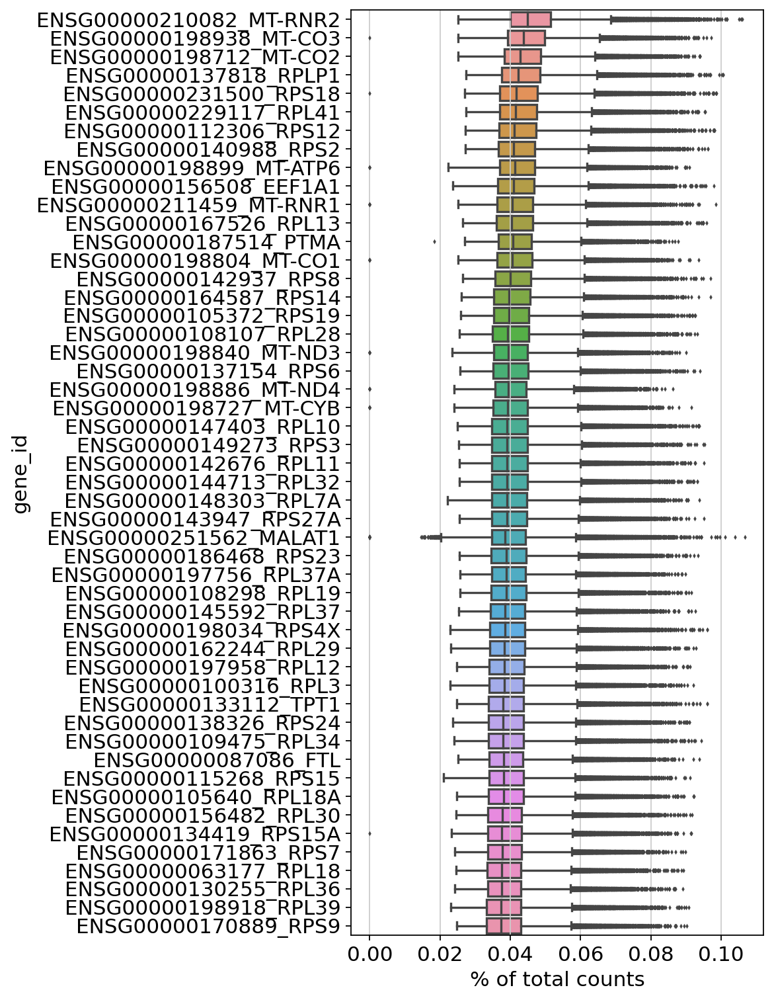

In [9]:
adata.var_names_make_unique()
sc.pl.highest_expr_genes(adata, n_top=50, )


In [13]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

Mitochondrial genes are important for quality control.
Citing from “Simple Single Cell” workflows (Lun, McCarthy & Marioni, 2017):

    High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.


In [14]:
adata.var['mt'] = adata.var_names.str.contains('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


A violin plot of some of the computed quality measures:

* the number of genes expressed in the count matrix
* the total counts per cell
* the percentage of counts in mitochondrial genes

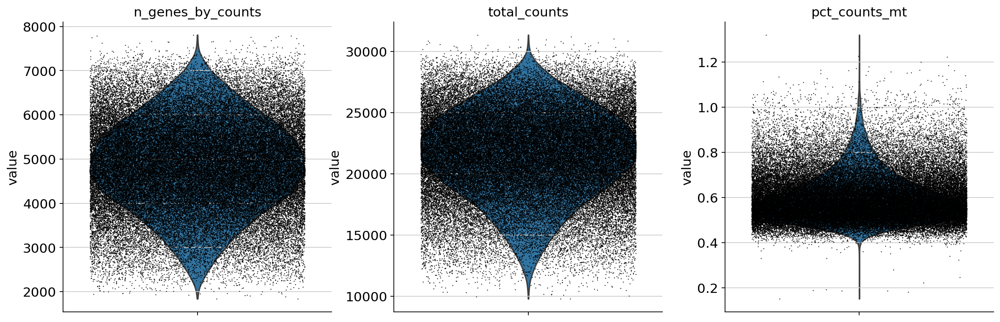

In [15]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)


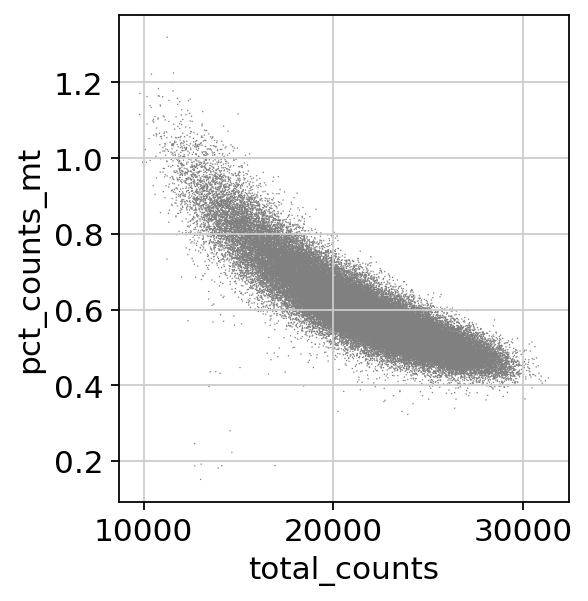

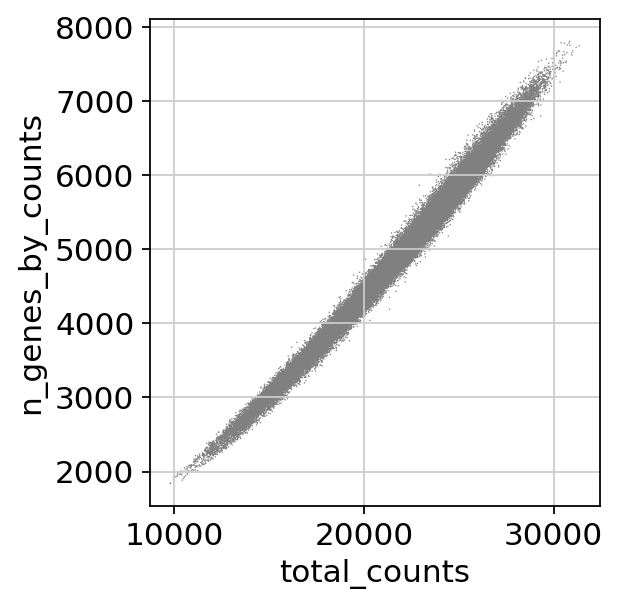

In [16]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')


In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)


normalizing counts per cell
    finished (0:00:00)


In [18]:

sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)


extracting highly variable genes
    finished (0:00:09)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


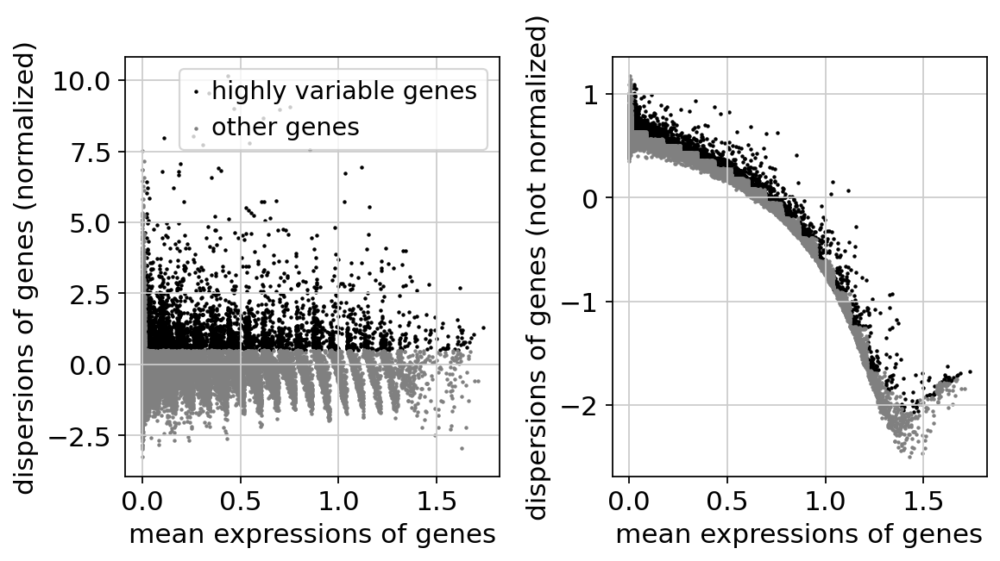

In [19]:
sc.pl.highly_variable_genes(adata)


In [20]:
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:01:30)


In [21]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(adata, max_value=10)

In [22]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:17)


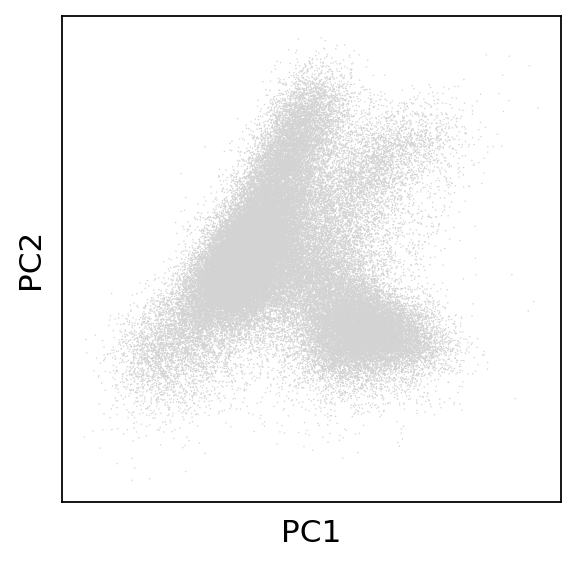

In [28]:
sc.pl.pca(adata)

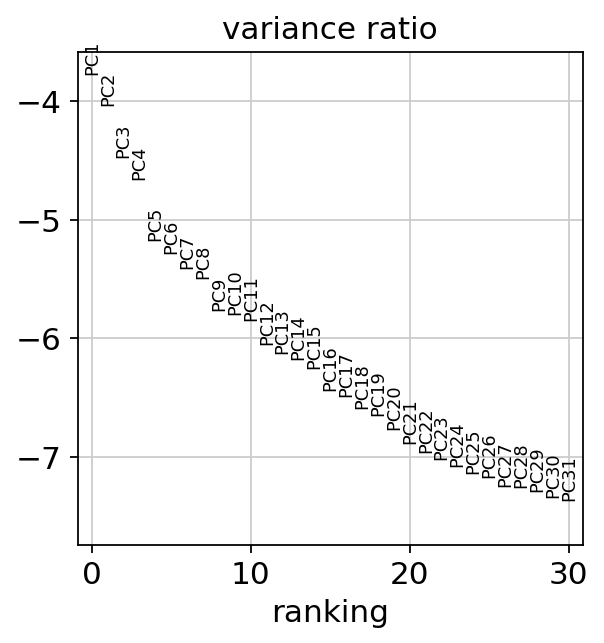

In [30]:
sc.pl.pca_variance_ratio(adata, log=True)

In [31]:
sc.pp.neighbors(adata, n_neighbors=25, n_pcs=50)


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)


In [32]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:26)


running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:15)


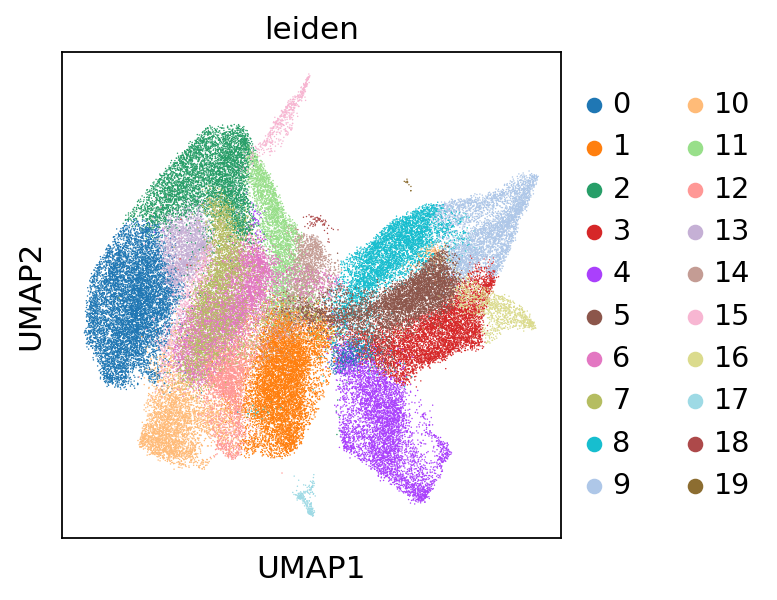

In [33]:
sc.tl.leiden(adata)
sc.pl.umap(adata, color=['leiden'])

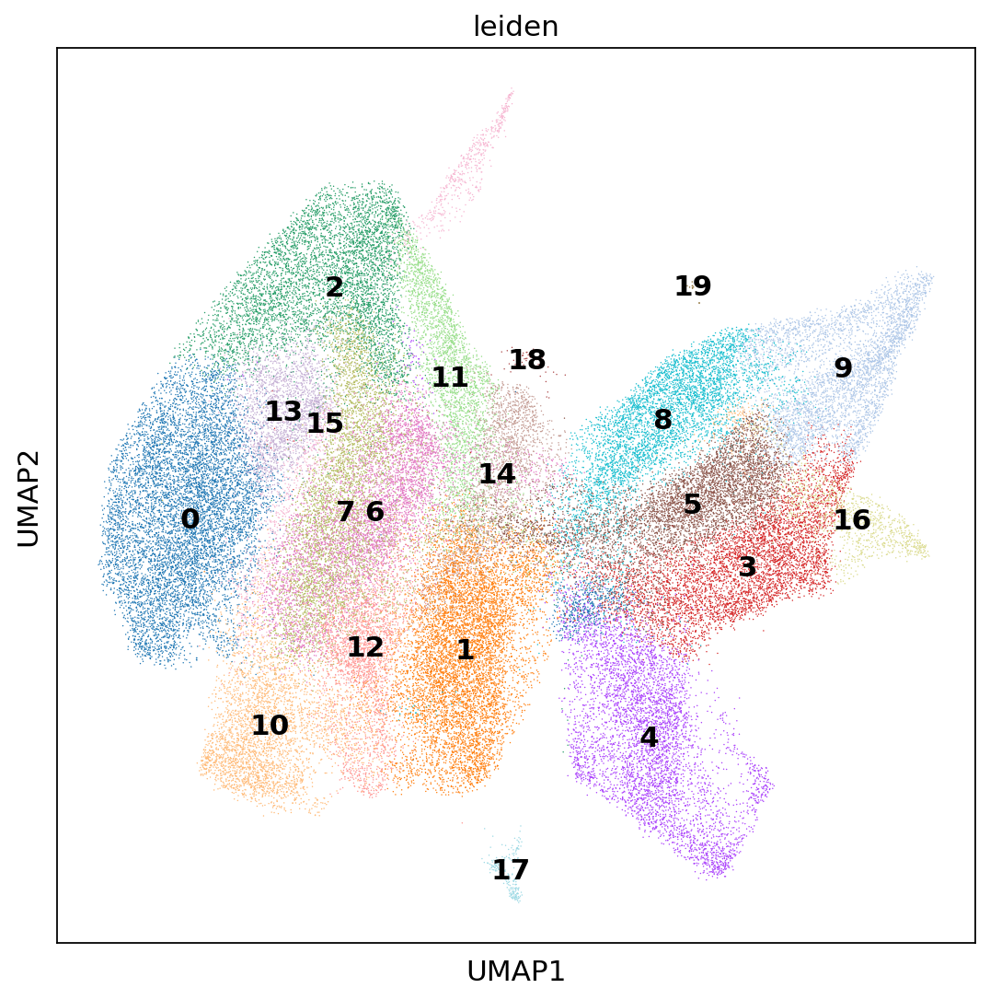

In [36]:
with plt.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color=['leiden'],legend_loc='on data')


In [38]:
results_file = os.path.join(DATA_DIR, "results.h5ad")
adata.write(results_file)


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:11)


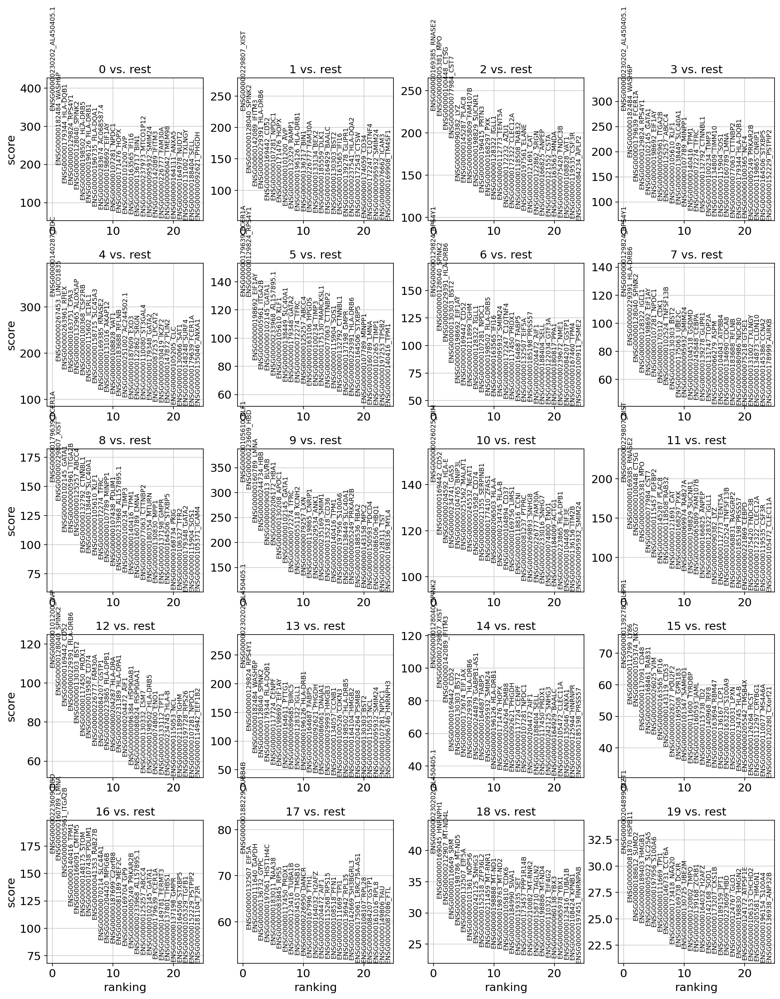

In [39]:
# Let us compute a ranking for the highly differential genes in each cluster.
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [41]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,ENSG00000230202_AL450405.1,ENSG00000229807_XIST,ENSG00000169385_RNASE2,ENSG00000230202_AL450405.1,ENSG00000140287_HDC,ENSG00000179639_FCER1A,ENSG00000129824_RPS4Y1,ENSG00000129824_RPS4Y1,ENSG00000179639_FCER1A,ENSG00000105610_KLF1,ENSG00000026025_VIM,ENSG00000229807_XIST,ENSG00000101200_AVP,ENSG00000230202_AL450405.1,ENSG00000128040_SPINK2,ENSG00000139278_GLIPR1,ENSG00000223609_HBD,ENSG00000188229_TUBB4B,ENSG00000230202_AL450405.1,ENSG00000204899_MZT1
1,ENSG00000182484_WASH6P,ENSG00000128040_SPINK2,ENSG00000005381_MPO,ENSG00000182484_WASH6P,ENSG00000267453_LINC01835,ENSG00000129824_RPS4Y1,ENSG00000128040_SPINK2,ENSG00000229391_HLA-DRB6,ENSG00000229807_XIST,ENSG00000223609_HBD,ENSG00000169442_CD52,ENSG00000169385_RNASE2,ENSG00000128040_SPINK2,ENSG00000129824_RPS4Y1,ENSG00000229807_XIST,ENSG00000112799_LY86,ENSG00000160789_LMNA,ENSG00000132507_EIF5A,ENSG00000169045_HNRNPH1,ENSG00000081870_HSPB11
2,ENSG00000179344_HLA-DQB1,ENSG00000142089_IFITM3,ENSG00000100448_CTSG,ENSG00000179639_FCER1A,ENSG00000263961_RHEX,ENSG00000198692_EIF1AY,ENSG00000229391_HLA-DRB6,ENSG00000128040_SPINK2,ENSG00000102145_GATA1,ENSG00000160789_LMNA,ENSG00000204592_HLA-E,ENSG00000100448_CTSG,ENSG00000169442_CD52,ENSG00000182484_WASH6P,ENSG00000142089_IFITM3,ENSG00000105374_NKG7,ENSG00000005961_ITGA2B,ENSG00000111640_GAPDH,ENSG00000212907_MT-ND4L,ENSG00000188612_SUMO2
3,ENSG00000129824_RPS4Y1,ENSG00000229391_HLA-DRB6,ENSG00000077984_CST7,ENSG00000129824_RPS4Y1,ENSG00000163751_CPA3,ENSG00000005961_ITGA2B,ENSG00000130303_BST2,ENSG00000128322_IGLL1,ENSG00000005961_ITGA2B,ENSG00000244734_HBB,ENSG00000234741_GAS5,ENSG00000005381_MPO,ENSG00000229391_HLA-DRB6,ENSG00000128040_SPINK2,ENSG00000169442_CD52,ENSG00000117091_CD48,ENSG00000140416_TPM1,ENSG00000136732_GYPC,ENSG00000116649_SRM,ENSG00000189403_HMGB1
4,ENSG00000128040_SPINK2,ENSG00000169442_CD52,ENSG00000090382_LYZ,ENSG00000102145_GATA1,ENSG00000132965_ALOX5AP,ENSG00000102145_GATA1,ENSG00000198692_EIF1AY,ENSG00000198692_EIF1AY,ENSG00000125257_ABCC4,ENSG00000090013_BLVRB,ENSG00000104765_BNIP3L,ENSG00000077984_CST7,ENSG00000130303_BST2,ENSG00000179344_HLA-DQB1,ENSG00000130303_BST2,ENSG00000168461_RAB31,ENSG00000166091_CMTM5,ENSG00000197061_HIST1H4C,ENSG00000198786_MT-ND5,ENSG00000005022_SLC25A5


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:34)


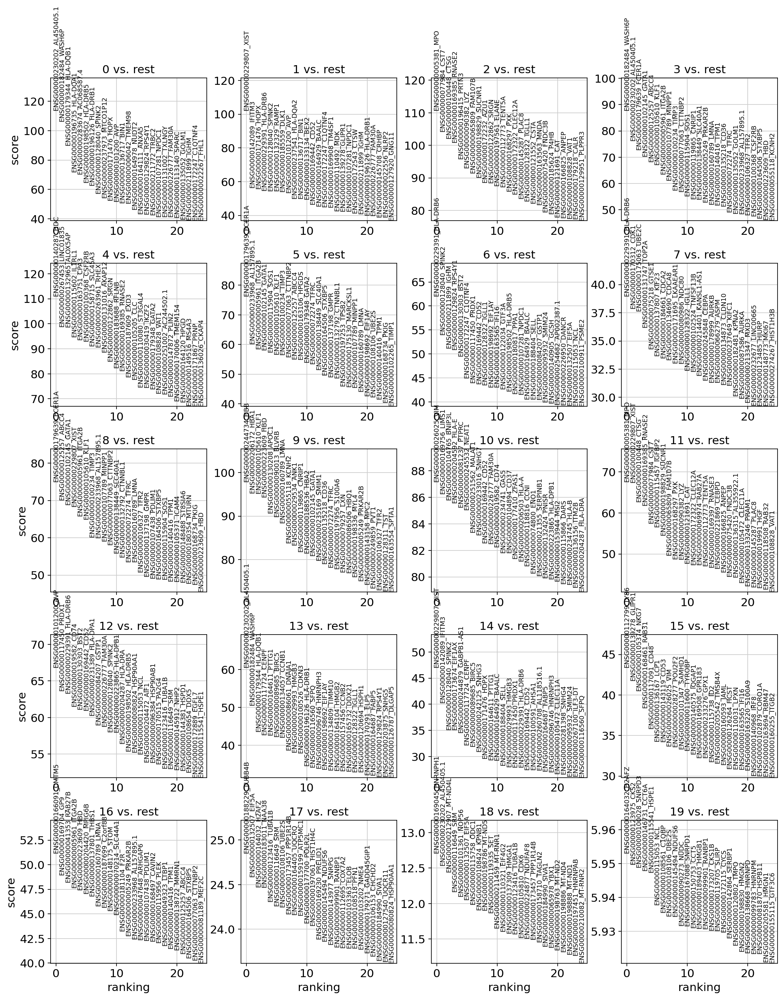

In [42]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [43]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,ENSG00000230202_AL450405.1,ENSG00000229807_XIST,ENSG00000005381_MPO,ENSG00000182484_WASH6P,ENSG00000140287_HDC,ENSG00000179639_FCER1A,ENSG00000229391_HLA-DRB6,ENSG00000229391_HLA-DRB6,ENSG00000179639_FCER1A,ENSG00000244734_HBB,ENSG00000026025_VIM,ENSG00000005381_MPO,ENSG00000101200_AVP,ENSG00000230202_AL450405.1,ENSG00000229807_XIST,ENSG00000112799_LY86,ENSG00000166091_CMTM5,ENSG00000188229_TUBB4B,ENSG00000169045_HNRNPH1,ENSG00000164032_H2AFZ
1,ENSG00000182484_WASH6P,ENSG00000142089_IFITM3,ENSG00000077984_CST7,ENSG00000230202_AL450405.1,ENSG00000267453_LINC01835,ENSG00000233968_AL157895.1,ENSG00000128040_SPINK2,ENSG00000170312_CDK1,ENSG00000125257_ABCC4,ENSG00000206172_HBA1,ENSG00000169756_LIMS1,ENSG00000229807_XIST,ENSG00000117450_PRDX1,ENSG00000182484_WASH6P,ENSG00000142089_IFITM3,ENSG00000139278_GLIPR1,ENSG00000169704_GP9,ENSG00000132507_EIF5A,ENSG00000230202_AL450405.1,ENSG00000123975_CKS2
2,ENSG00000179344_HLA-DQB1,ENSG00000171476_HOPX,ENSG00000100448_CTSG,ENSG00000179639_FCER1A,ENSG00000132965_ALOX5AP,ENSG00000005961_ITGA2B,ENSG00000211899_IGHM,ENSG00000175063_UBE2C,ENSG00000102145_GATA1,ENSG00000105610_KLF1,ENSG00000104765_BNIP3L,ENSG00000100448_CTSG,ENSG00000229391_HLA-DRB6,ENSG00000179344_HLA-DQB1,ENSG00000128040_SPINK2,ENSG00000105374_NKG7,ENSG00000041353_RAB27B,ENSG00000164032_H2AFZ,ENSG00000212907_MT-ND4L,ENSG00000100028_SNRPD3
3,ENSG00000196735_HLA-DQA1,ENSG00000229391_HLA-DRB6,ENSG00000169385_RNASE2,ENSG00000102145_GATA1,ENSG00000115602_IL1RL1,ENSG00000102145_GATA1,ENSG00000129824_RPS4Y1,ENSG00000131747_TOP2A,ENSG00000229807_XIST,ENSG00000223609_HBD,ENSG00000204592_HLA-E,ENSG00000169385_RNASE2,ENSG00000019582_CD74,ENSG00000117724_CENPF,ENSG00000173674_EIF1AX,ENSG00000168461_RAB31,ENSG00000005961_ITGA2B,ENSG00000183011_NAA38,ENSG00000116649_SRM,ENSG00000146731_CCT6A
4,ENSG00000283674_AC068587.4,ENSG00000128040_SPINK2,ENSG00000196415_PRTN3,ENSG00000125257_ABCC4,ENSG00000163751_CPA3,ENSG00000115904_SOS1,ENSG00000130303_BST2,ENSG00000075218_GTSE1,ENSG00000005961_ITGA2B,ENSG00000130208_APOC1,ENSG00000081237_PTPRC,ENSG00000077984_CST7,ENSG00000130303_BST2,ENSG00000164611_PTTG1,ENSG00000244879_GABPB1-AS1,ENSG00000117091_CD48,ENSG00000223609_HBD,ENSG00000123416_TUBA1B,ENSG00000101361_NOP56,ENSG00000115541_HSPE1


In [44]:
adata.var.head()

,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
gene_id,,,,,,,,,,,,
ENSG00000268895_A1BG-AS1,3785,False,3785,0.199111,94.668113,14134.463867,True,0.089097,0.582727,0.790880,2.230304e-12,0.227081
ENSG00000115977_AAK1,39390,False,39390,2.305742,44.511748,163680.031250,True,0.723509,-0.017542,0.838665,-4.429060e-11,0.529790
ENSG00000087884_AAMDC,39981,False,39981,2.295783,43.679213,162973.031250,True,0.734675,-0.016848,0.847485,2.802312e-11,0.540041
ENSG00000165029_ABCA1,706,False,706,0.037715,99.005466,2677.320312,True,0.017303,0.646432,0.582943,-1.217714e-11,0.100468
ENSG00000179869_ABCA13,885,False,885,0.048701,98.753310,3457.152832,True,0.023061,0.696323,1.238331,1.422990e-12,0.116634


In [45]:
adata.write(results_file)

In [46]:
sc.tl.paga(adata, groups='leiden')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)


--> added 'pos', the PAGA positions (adata.uns['paga'])


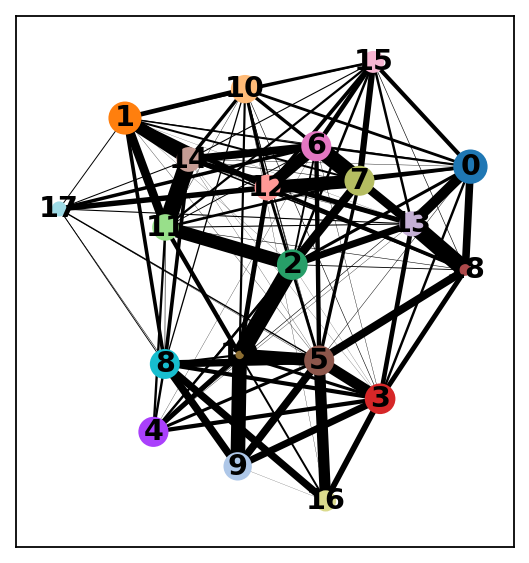

In [47]:
sc.pl.paga(adata, color=['leiden'])

In [48]:
import scFates as scf

In [73]:
scf.tl.curve(adata,Nodes=30,use_rep="X_umap",ndims_rep=2,)
scf.tl.root(adata,"ENSG00000230202_AL450405.1")

inferring a principal curve --> parameters used 
    30 principal points, mu = 0.1, lambda = 0.01
    finished (0:00:13) --> added 
    .uns['epg'] dictionnary containing inferred elastic curve generated from elpigraph.
    .obsm['X_R'] hard assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'], coordinates of principal points in representation space.
automatic root selection using ENSG00000230202_AL450405.1 values
node 6 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [74]:
scf.tl.convert_to_soft(adata,1,1000)

Converting R into soft assignment matrix
    finished (0:00:00) --> updated 
    .obsm['X_R'] converted soft assignment of cells to principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


In [75]:
scf.tl.pseudotime(adata,n_jobs=20,n_map=100,seed=42)

projecting cells onto the principal graph
    mappings: 100%|██████████| 100/100 [05:18<00:00,  3.18s/it]
    finished (0:05:35) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.


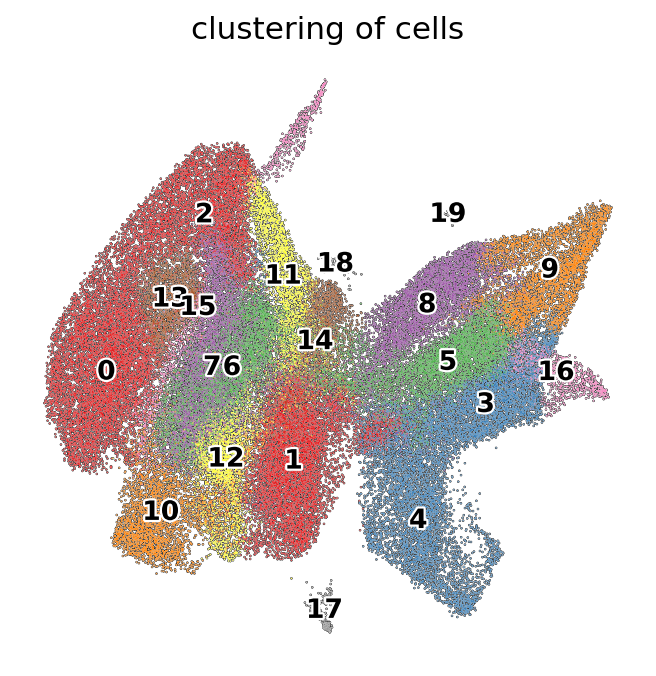

In [76]:
with plt.rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=12, legend_fontoutline=2,frameon=False,
               title='clustering of cells', palette='Set1')

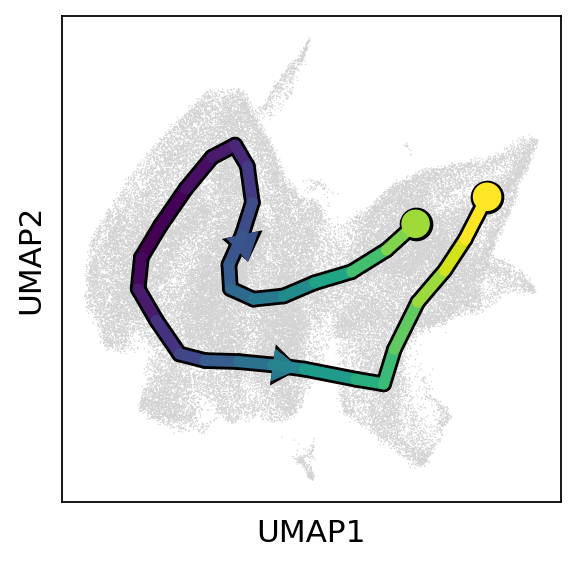

In [77]:
scf.pl.trajectory(adata,basis="umap",arrows=True,arrow_offset=3)